# Computer Vision ITS8030 Autumn 2020

## Homework 2, Urmas Pitsi

### Connect to Google drive and set current working directory

In [18]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [19]:
%cd /content/drive/My Drive/TalTech Informaatika/2020 sügis/Computer Vision ITS8030/hw2/

/content/drive/My Drive/TalTech Informaatika/2020 sügis/Computer Vision ITS8030/hw2


### Install fastai

source: https://github.com/fastai/fastai/blob/master/nbs/23_tutorial.vision.ipynb


In [20]:
# source: https://github.com/fastai/fastai/blob/master/nbs/10_tutorial.pets.ipynb
! [ -e /content ] && pip install -Uqq fastai  # upgrade fastai on colab

In [21]:
from fastai.vision.all import *

### Libraries and helper functions

In [22]:
from PIL import Image as PIM
from PIL import ImageDraw as PIMDraw
from sklearn.metrics import classification_report, precision_recall_curve, average_precision_score

def scale_between(arr, min_value=0.0, max_value=1.0):
    x_min, x_max = arr.min(), arr.max()
    return (arr - x_min) / (x_max - x_min) * (max_value - min_value) + min_value

def to_uint8(im):
  return scale_between(im, 0, 255).astype(np.uint8)

def numpy_to_PIL(im):
  return PIM.fromarray(to_uint8(im))

def PIL_to_numpy(im):
  return np.asarray(im)

def cuda_tensor_to_channel_last_numpy(t):
  return np.rollaxis(t.cpu().detach().numpy(), 1, 4)

def tensor_to_channel_last_numpy(t):
  return np.rollaxis(t.numpy(), 0, 3)

def tensor_to_PIL(t):
  return numpy_to_PIL(tensor_to_channel_last_numpy(t))

def PIL_to_tensor(im_pil):
  numpy_channel_first = np.rollaxis(PIL_to_numpy(im_pil), 2, 0)
  t = torch.from_numpy(np.expand_dims(numpy_channel_first, axis=0).astype(np.float32))
  return t

def create_mask(im, pct_from_max=0.1):
  threshold = int(im.max() * (1 - pct_from_max))
  res = np.zeros_like(im)
  res[im > threshold] = 255
  return res

def heatmap_to_fastai_bounding_box(pil_im, pct_from_max=0.2):
  '''
    Returns coordinates 4-tuple: x0, y0, x1, y1.
    top-left (x0, y0) and bottom-right (x1, y1) corners.
    pct_from_max: creates a mask with values in top pct from max value.
  '''
  return PILImage.getbbox(numpy_to_PIL(create_mask(PIL_to_numpy(pil_im), pct_from_max=pct_from_max)))

def draw_bounding_box(im_pil, bbox_fastai, color='red', width=1):
  res = im_pil.copy()
  drawing = PIMDraw.Draw(res)
  x0, y0, x1, y1 = bbox_fastai
  drawing.rectangle([(x0, y0), (x1, y1)], fill=None, outline=color, width=width)
  return res

def draw_bounding_box_with_ground_truth(im_pil, bbox_pred_fastai, bbox_truth_fastai, width=1):
  res = im_pil.copy()
  drawing = PIMDraw.Draw(res)
  x0, y0, x1, y1 = bbox_pred_fastai
  drawing.rectangle([(x0, y0), (x1, y1)], fill=None, outline='red', width=width)

  x0, y0, x1, y1 = bbox_truth_fastai
  drawing.rectangle([(x0, y0), (x1, y1)], fill=None, outline='green', width=width)
  return res


In [23]:
def label_func(f):
  return 'lusitania' if 'lusitania' in f else 'limax'

def label_func_path(f):
  return 'lusitania' if 'lusitania' in f.name else 'limax'

def predict_dataset(paths, learner):
  predicted_labels = []
  true_labels = []
  image_paths = []
  probabilities = []
  correct = []
  wrong = []

  for image_path in progress_bar(paths):
    pred_label, tensor, probs = learn.predict(image_path)
    image_paths.append(image_path)
    predicted_labels.append(pred_label)
    true_label = label_func_path(image_path)
    true_labels.append(true_label)
    probabilities.append(float(probs[1].numpy())) # positve class only
    if pred_label == true_label:
      correct.append(image_path)
    else:
      wrong.append(image_path)

  return {
      'image_paths': image_paths,
      'predicted_labels': predicted_labels,
      'true_labels': true_labels,
      'probabilities': probabilities,
      'correct': correct,
      'wrong': wrong
  }

def hooked_backward(cat):
  with hook_output(m[0]) as hook_a: 
    with hook_output(m[0], grad=True) as hook_g:
      preds = m(xb)
      preds[0, int(cat)].backward()
  return hook_a, hook_g

def show_heatmap(hm, return_result=False):
  _,ax = plt.subplots()
  xb_im.show(ctx=ax)
  res = ax.imshow(hm, alpha=0.6, extent=(0,224,224,0), interpolation='bilinear', cmap='magma')
  if return_result:
    return res


### Image Classification

#### Data: Images, Data Loaders, Transforms/Augmentations

In [24]:
path = 'data256/'
path_images = path + 'all/'
files = get_image_files(path_images)

print(f'number of images: {len(files)}, files[0]={files[0]}')
print(label_func(files[10].name), ':', files[10].name)

number of images: 80, files[0]=data256/all/limax_2.jpg
limax : limax_3.png


In [25]:
# Experiment 1: 1 image per class
#etalons_lusitania = ['lusitania_20200723_210018.jpg']
#etalons_limax = ['limax_1.jpg']
#etalons = [Path(path_images + i) for i in (etalons_lusitania + etalons_limax)]
#mult_train = 100
#valid_pct = 0.1

# Experiment 2: 4 images per class
etalons_lusitania = ['lusitania_20200723_210018.jpg', 'lusitania_20200723_210055.jpg', 'lusitania_arion_lusitanicus_9.jpg', 'lusitania_arion_vulgaris_4.jpg']
etalons_limax = ['limax_1.jpg', 'limax_limax_cinereoniger_1.jpg', 'limax_limax_cinereoniger_2.jpg', 'limax_limax_maximus_10.jpg']
etalons = [Path(path_images + i) for i in (etalons_lusitania + etalons_limax)]
mult_train = 100
valid_pct = 0.1

# Experiment 3: 20 images per class: classic setup Data split: 50/50 Train/Test. Train/Valid split: 80/20.
# No extending (mult_train = 1): validation set is independent of train set.
#mult_train = 1
#valid_pct = 0.2
#etalons_lusitania = [i for i in get_image_files(path_images) if label_func_path(i) == 'lusitania'][:20]
#etalons_limax = [i for i in get_image_files(path_images) if label_func_path(i) == 'limax'][:20]
#etalons = (etalons_lusitania + etalons_limax)

etalon_paths = [x for x in files if x in etalons]
test_paths = [x for x in files if x not in etalons]

print(f'number of etalons={len(etalons)}')
print(f'number of images: train={mult_train * len(etalons)}, test={len(test_paths)}')

# source: https://github.com/fastai/fastai/blob/master/dev_nbs/course/lesson6-pets-more.ipynb
def get_etalons(source):
  source_images = get_image_files(source)
  res = [im_path for im_path in source_images if im_path in etalons]
  return mult_train * res

number of etalons=8
number of images: train=800, test=72


In [26]:
# Sanity check: train and test paths must be different!!!
assert len(set.intersection(set(test_paths), set(etalon_paths))) == 0
print('Train/Test split seems good! No overlap detected.')

Train/Test split seems good! No overlap detected.


Show selected etalons

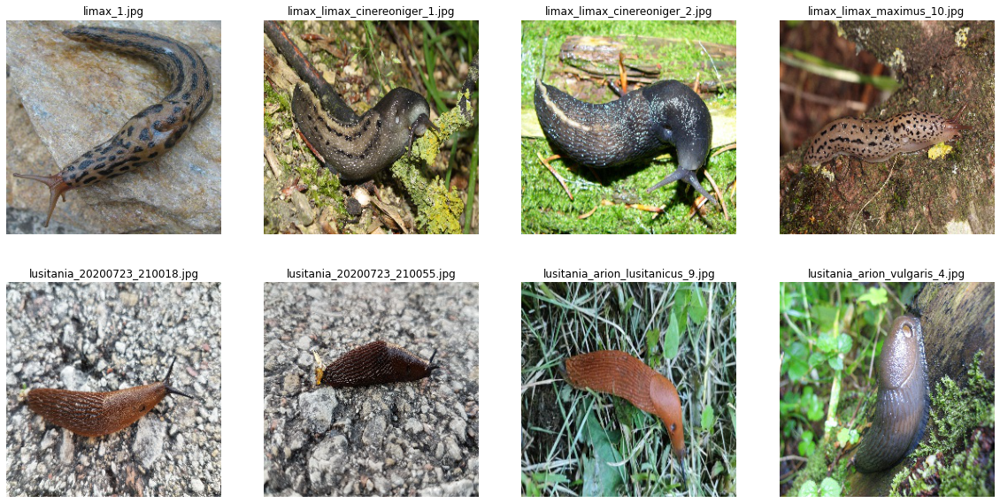

In [27]:
show_images([PILImage.create(fn) for fn in etalon_paths], titles=[fn.name for fn in etalon_paths], nrows=2, imsize=5)

In [28]:
item_tfms = [Resize(224)]
#batch_tfms = [*aug_transforms(xtra_tfms=None, flip_vert=True)]
# source: https://docs.fast.ai/vision.augment.html
#tfms = [Rotate(), Zoom(), Warp(), Brightness(), Flip(), Contrast()]
tfms = partial(aug_transforms, flip_vert=True, max_rotate=45, max_zoom=1.3, max_lighting=0.8, max_warp=0.4, p_affine=0.5, p_lighting=0.5)
batch_tfms = [*tfms(size=224, pad_mode='reflection', batch=False), Normalize.from_stats(*imagenet_stats)]

In [29]:
dblock = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_etalons,
    get_y = label_func_path, # here x is Path object: x.name = file name.
#    splitter = IndexSplitter(valid_idx=valid_idx), # RandomSplitter(),
    splitter = RandomSplitter(valid_pct=valid_pct),
    item_tfms = item_tfms,
    batch_tfms = batch_tfms
    )

In [30]:
dls = dblock.dataloaders(path_images, path=path, bs=64) #64 or 16

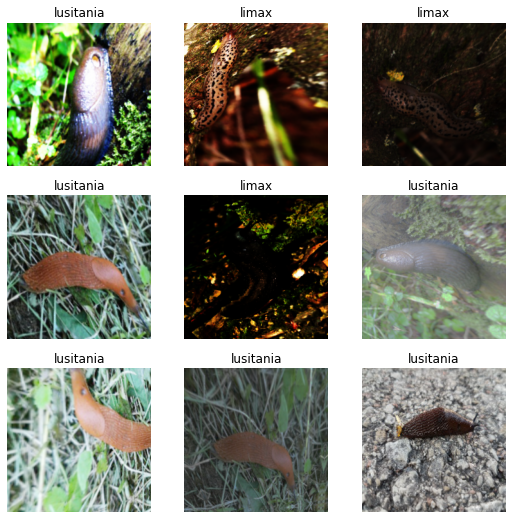

In [31]:
dls[0].show_batch(max_n=9) # Train dataset

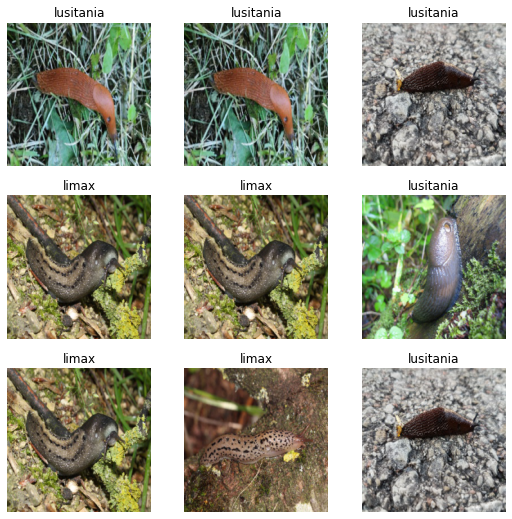

In [32]:
dls[1].show_batch(max_n=9) # Validation dataset

#### Training

In [33]:
learn = cnn_learner(dls, resnet34, metrics=[error_rate, accuracy], pretrained=True)
#learn = cnn_learner(dls, resnet50, metrics=[error_rate, accuracy], pretrained=True)

In [ ]:
#learn.load('resnet34_4images_test_acc89')

In [ ]:
%time learn.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.605525,0.000008,0.000000,1.000000,00:05


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.038480,0.000003,0.000000,1.000000,00:05
1,0.033091,0.000240,0.000000,1.000000,00:05
2,0.030798,0.000008,0.000000,1.000000,00:05
3,0.023608,0.000001,0.000000,1.000000,00:05
4,0.019004,0.000001,0.000000,1.000000,00:05


CPU times: user 12.5 s, sys: 6.16 s, total: 18.7 s
Wall time: 32.9 s


In [ ]:
#learn.show_results(ds_idx=1, shuffle=False)

In [ ]:
interp = Interpretation.from_learner(learn)

In [ ]:
#interp.plot_top_losses(4, figsize=(15,11))

#### Test on unseen images

In [34]:
learn.load('resnet34_4images_test_acc89')
classifier_learner = learn
classifier_model = learn.model.eval()
#classifier_model = learn.model.eval().cuda()

In [35]:
item_tfms_test = [Resize(224)]
batch_tfms_test = [Normalize.from_stats(*imagenet_stats)]

dls_test = ImageDataLoaders.from_name_func(path, test_paths, label_func=label_func,
                                           item_tfms=item_tfms_test, batch_tfms=batch_tfms_test, bs=64,
                                           shuffle_train=False, valid_pct=0)
dls_test[0].shuffle = False

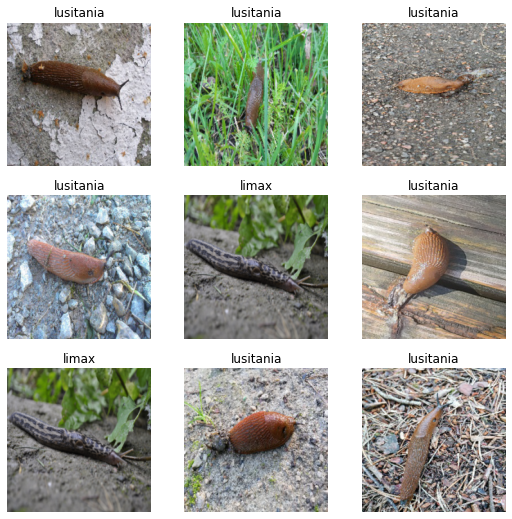

In [ ]:
dls_test.show_batch(max_n=9)

In [ ]:
test_predictions = predict_dataset(test_paths, learn)

In [ ]:
preds = test_predictions['predicted_labels']
truth = test_predictions['true_labels']
test_accuracy = len([p for p,t in zip(preds, truth) if p == t]) / len(preds)
print(f'test_accuracy={round(test_accuracy * 100, 1)}%')

test_accuracy=87.5%


In [ ]:
precision_lusitania = len([p for p,t in zip(preds, truth) if p == t and t == 'lusitania']) / len([p for p in preds if p == 'lusitania'])
precision_limax = len([p for p,t in zip(preds, truth) if p == t and t == 'limax']) / len([p for p in preds if p == 'limax'])

# Recall Lusitania = tp / (tp + fn)
tp = len([p for p,t in zip(preds, truth) if p == t and t == 'lusitania'])
fn = len([p for p,t in zip(preds, truth) if p == 'limax' and t == 'lusitania'])
recall_lusitania = tp / (tp + fn)

# Recall Limax = tp / (tp + fn)
tp = len([p for p,t in zip(preds, truth) if p == t and t == 'limax'])
fn = len([p for p,t in zip(preds, truth) if p == 'lusitania' and t == 'limax'])
recall_limax = tp / (tp + fn)

print(f'precision: limax/lusitania: {round(precision_limax, 2)}/{round(precision_lusitania, 2)}')
print(f'recall: limax/lusitania: {round(recall_limax, 2)}/{round(recall_lusitania, 2)}')


precision: limax/lusitania: 0.86/0.89
recall: limax/lusitania: 0.89/0.86


In [ ]:
target_names = ['Limax', 'Lusitania']
print(classification_report(truth, preds, target_names=target_names))

              precision    recall  f1-score   support

       Limax       0.86      0.89      0.88        36
   Lusitania       0.89      0.86      0.87        36

    accuracy                           0.88        72
   macro avg       0.88      0.88      0.87        72
weighted avg       0.88      0.88      0.87        72



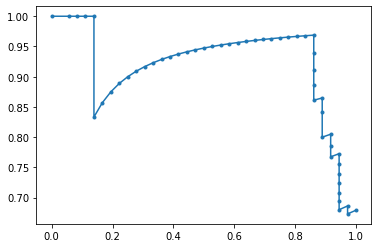

In [ ]:
precision, recall, thresholds = precision_recall_curve(truth, probas_pred=test_predictions['probabilities'], pos_label='lusitania')
plt.plot(recall, precision, marker='.', label='Lusitania/Limax')

In [ ]:
average_precision_score(test_predictions['true_labels'], test_predictions['probabilities'], pos_label='lusitania')

0.9222081884377471

In [ ]:
#learn.show_results(dl=dls_test, shuffle=False, max_n=25) ##len(test_paths))

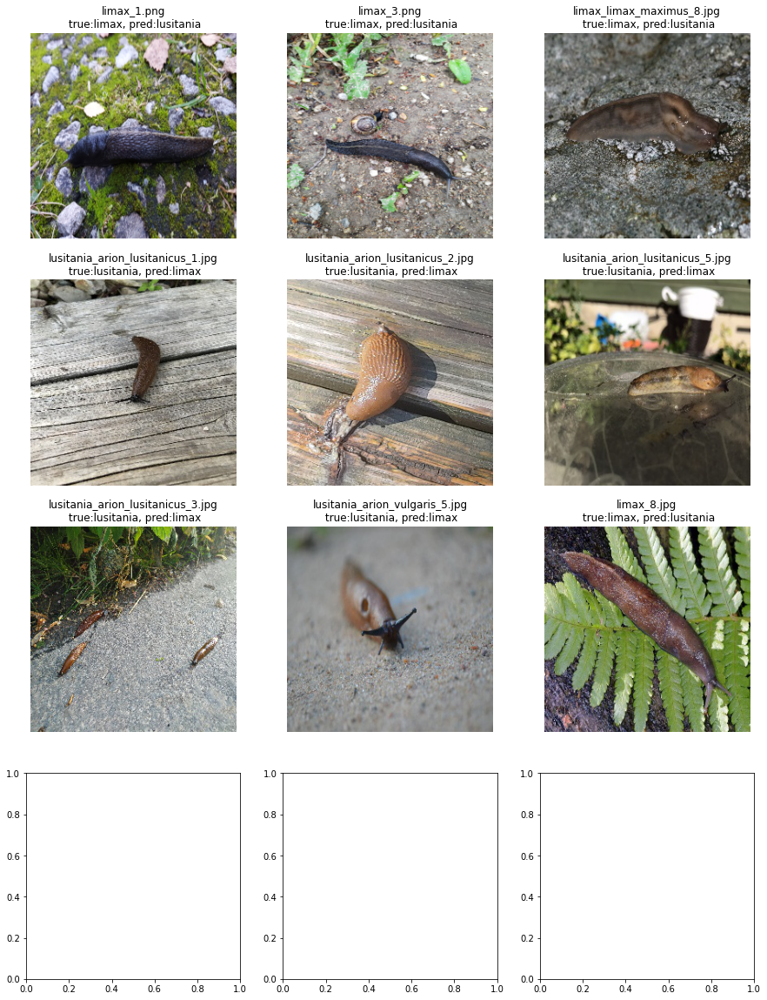

In [ ]:
# Show wrong predictions
wrong_imgs = [PILImage.create(fn) for fn in test_predictions['wrong']]
correct_labels = [label_func_path(fn) for fn in test_predictions['wrong']]
wrong_pred_labels = ['lusitania' if i == 'limax' else 'limax' for i in correct_labels]
titles = [f'{n.name}\n true:{tr}, pred:{pr}' for tr,pr,n in zip(correct_labels, wrong_pred_labels, test_predictions['wrong'])]
show_images(wrong_imgs, nrows=4, titles=titles, imsize=5)

In [ ]:
# check if all images are tested and only once
input_names = test_paths
pred_names = test_predictions['image_paths']
assert len(pred_names) == len(input_names) # file count matches
assert len(set(pred_names)) == len(pred_names) # all filenames are unique in predicted set
assert len(input_names) == len(set(input_names)) # all filenames are unique in input test set
assert len(set(pred_names) - set(input_names)) == 0 # all predictions come from inputs
assert len(set(input_names) - set(pred_names)) == 0 # all inputs have been used in predictions

print(f'All tests passed! tested {len(test_paths)} images')

All tests passed! tested 72 images


#### Object detection: derive bounding boxes from attention heatmaps

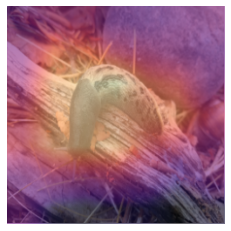

In [37]:
# source: https://github.com/fastai/fastai/blob/master/dev_nbs/course/lesson6-pets-more.ipynb
m = learn.model.eval()

fn = test_paths[2]
#fn = etalon_paths[0]
x = PILImage.create(fn)

dl = dls.test_dl([fn])
b = dl.one_batch()
xb_im = TensorImage(dls.train.decode(b)[0][0])
xb = b[0]

predicted_label, t, prediction_probabilities = learn.predict(xb_im)
y_cat = learn.dls.categorize(predicted_label)
#y_cat = learn.dls.categorize('lusitania')
#y_cat = learn.dls.categorize('limax')
hook_a, hook_g = hooked_backward(cat=y_cat)

acts = hook_a.stored[0].cpu()
grad = hook_g.stored[0][0].cpu()
grad_chan = grad.mean(1).mean(1)
mult = (acts * grad_chan[..., None, None]).mean(0)

heatmap_result = show_heatmap(mult, return_result=True)
hot_point = np.asarray(heatmap_result.get_array())
hot_point_224 = numpy_to_PIL(hot_point).resize((224,224))

pct_from_max=0.30
mask_pil = numpy_to_PIL(create_mask(PIL_to_numpy(hot_point_224), pct_from_max=pct_from_max))
bbox_fastai = heatmap_to_fastai_bounding_box(hot_point_224, pct_from_max=pct_from_max)

Correct! This is limax. Probabilities(Limax/Lusitania)=0.99, 0.01
Image: limax_5.png
BoundingBox: (28, 42, 188, 162)


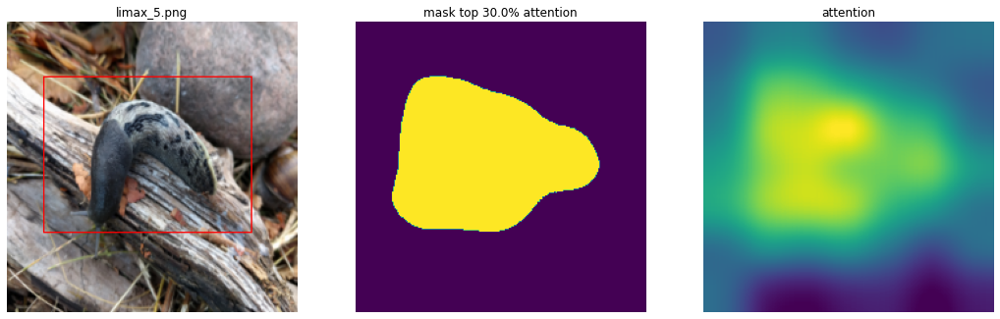

In [38]:
show_images([
             draw_bounding_box(tensor_to_PIL(xb_im), bbox_fastai=bbox_fastai),
             mask_pil, hot_point_224,
             ], imsize=6, titles=[f'{fn.name}', f'mask top {pct_from_max*100}% attention', 'attention'])

true_label = label_func_path(fn)
prediction_probabilities = prediction_probabilities.numpy()
p1, p2 = str(round(prediction_probabilities[0], 2)), str(round(prediction_probabilities[1], 2))

res = f'Correct! This is {true_label}.' if true_label == predicted_label else f'Wrong prediction! This is {true_label} not {predicted_label}'
print(f'{res} Probabilities(Limax/Lusitania)={p1}, {p2}')
print(f'Image: {fn.name}')
if true_label != predicted_label:
  print(f'true: {true_label} / predicted: {predicted_label}')
print(f'BoundingBox: {bbox_fastai}')

### Object detection: Bounding boxes from scratch

#### Data: Images, Bounding Boxes, Data Loaders, Transforms/Augmentations

In [77]:
etalons_lusitania = ['lusitania_20200723_210018.jpg', 'lusitania_20200723_210055.jpg', 'lusitania_arion_lusitanicus_9.jpg', 'lusitania_arion_vulgaris_4.jpg']
etalons_limax = ['limax_1.jpg', 'limax_limax_cinereoniger_1.jpg', 'limax_limax_cinereoniger_2.jpg', 'limax_limax_maximus_10.jpg']
etalons = (etalons_lusitania + etalons_limax)
print(f'number of etalons={len(etalons)}')

test_files = [x for x in files if x.name not in etalons]

mult_train = 100
print(f'number of images: train={mult_train * len(etalons)}, test={len(test_files)}')

# source: https://github.com/fastai/fastai/blob/master/dev_nbs/course/lesson6-pets-more.ipynb
def get_etalons(source):
  source_images = get_image_files(source)
  res = [im_path for im_path in source_images if im_path.name in etalons]
  return mult_train * res

bboxes = {
  'lusitania_20200723_210018.jpg': [24, 86, 200, 99],
  'lusitania_20200723_210055.jpg': [66, 69, 144, 56],
  'lusitania_arion_lusitanicus_9.jpg': [51, 80, 144, 138],
  'lusitania_arion_vulgaris_4.jpg': [88, 39, 91, 190],

  'limax_1.jpg': [7, 6, 240, 242],
  'limax_limax_cinereoniger_1.jpg': [32, 73, 179, 120],
  'limax_limax_cinereoniger_2.jpg': [14, 69, 220, 154],
  'limax_limax_maximus_10.jpg': [27, 95, 204, 78]
}
# convert opencv/coco bounding box into fastai format: x,y,x2,y2
img2bbox = {k: [x, y, x + w, y + h] for k,(x,y,w,h) in bboxes.items()}

number of etalons=8
number of images: train=800, test=72


In [78]:
item_tfms = [Resize(224)]
# source: https://docs.fast.ai/vision.augment.html
#tfms = [Rotate(), Zoom(), Warp(), Brightness(), Flip(), Contrast()]
tfms = partial(aug_transforms, flip_vert=True, max_rotate=45, max_zoom=1.3, max_lighting=0.8, max_warp=0.4, p_affine=0.5, p_lighting=0.5)
batch_tfms = [*tfms(size=224, pad_mode='reflection', batch=False), Normalize.from_stats(*imagenet_stats)]

dblock = DataBlock(blocks=(ImageBlock, BBoxBlock, BBoxLblBlock),
                 get_items=get_etalons,
                 splitter=RandomSplitter(valid_pct=0.1),
                 get_y=[lambda x: TensorBBox.create(img2bbox[x.name]), lambda x: [1] if 'lusitania' in x.name else [0] ],
                 item_tfms=item_tfms,
                 batch_tfms=batch_tfms,
                 n_inp=1)

dls = dblock.dataloaders(path_images, path=path, bs=64)

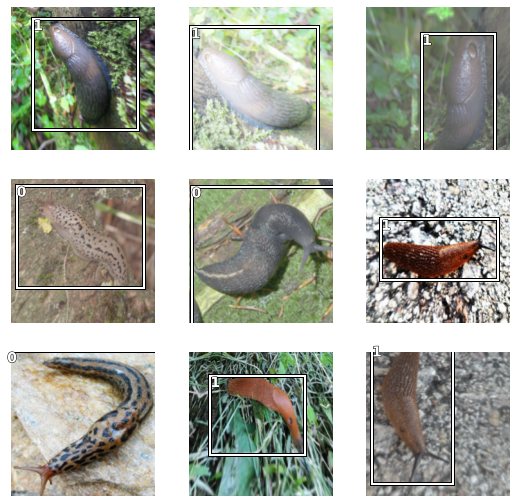

In [ ]:
dls[0].show_batch(max_n=9) # Train dataset=dls[0], valid=dls[1]

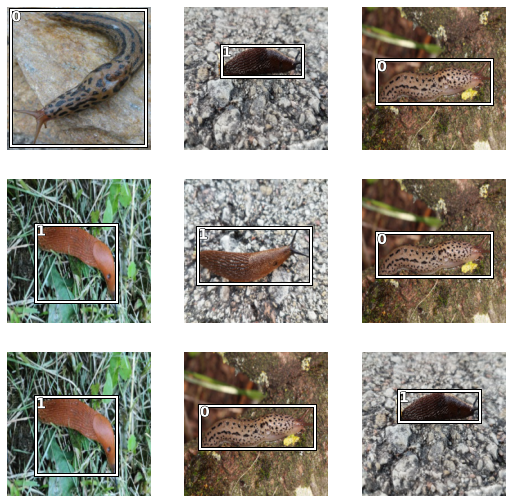

In [ ]:
dls[1].show_batch(max_n=9) # Validation dataset

#### Training

In [79]:
from torch.nn import L1Loss, MSELoss

In [81]:
# source: https://github.com/radekosmulski/whale/blob/master/fluke_detection_redux.ipynb

def intersection(preds, targs):
    # preds and targs are of shape (bs, 4), pascal_voc format
    max_xy = torch.min(preds[:, 2:], targs[:, 2:])
    min_xy = torch.max(preds[:, :2], targs[:, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, 0] * inter[:, 1]

def area(boxes):
    return ((boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1]))

def union(preds, targs):
    return area(preds) + area(targs) - intersection(preds, targs)

def IoU(preds, targs):
    return intersection(preds, targs) / union(preds, targs)

def loss_fn(preds, targs, class_idxs):
    return L1Loss()(preds, targs.squeeze())

def loss_fn_mse(preds, targs, class_idxs):
    return MSELoss()(preds, targs.squeeze())

In [82]:
cnn_bbox_metrics = [lambda preds, targs, _: IoU(preds, targs.squeeze()).mean()]
learn = cnn_learner(dls, resnet50, pretrained=False, loss_func=loss_fn, metrics=cnn_bbox_metrics)

In [ ]:
%time learn.fit_one_cycle(10, 1e-2, pct_start=0.2)
#%time learn.fit_one_cycle(50, 1e-2, pct_start=0.2)

epoch,train_loss,valid_loss,,time
0,1.405337,1.358324,0.046773,00:11
1,1.118144,201.916840,0.000000,00:10
2,0.934984,0.483657,0.237926,00:09
3,0.816026,0.289603,0.434234,00:10
4,0.730174,0.344569,0.381963,00:10
5,0.658633,0.194433,0.525666,00:10
6,0.598936,0.155350,0.587574,00:10
7,0.553262,0.138638,0.611534,00:10
8,0.516733,0.125419,0.645145,00:10
9,0.488840,0.128497,0.640305,00:10


CPU times: user 43.9 s, sys: 29.4 s, total: 1min 13s
Wall time: 1min 42s


In [ ]:
%time learn.fine_tune(5)

epoch,train_loss,valid_loss,,time
0,0.385521,0.147427,0.587995,00:08


epoch,train_loss,valid_loss,,time
0,0.382845,0.112815,0.654537,00:09
1,0.371064,0.131750,0.610848,00:09
2,0.370589,0.122762,0.626937,00:09
3,0.366413,0.102498,0.669787,00:09
4,0.356443,0.091455,0.695384,00:10


CPU times: user 25.3 s, sys: 16.5 s, total: 41.8 s
Wall time: 57.9 s


#### Inference: bounding box predictions with the trained model

In [83]:
#learn.load('resnet50_bbox_valloss_004_metr086')

In [84]:
bbox_predictor_model = learn.model.eval()
#bbox_predictor_model = learn.model.eval().cuda()

def raw_bbox_preds_to_uint8(bbox_preds, img_size=224):
  res = ((bbox_preds + 1) / 2 * img_size).cpu().detach().numpy()
  res = np.clip(res, 0, 255).astype(np.uint8)
  return res

def get_bbox_predictions(predictor_model, batch_to_predict):
  preds = predictor_model(batch_to_predict)
  img_size = batch_to_predict.shape[2]
  predicted_bboxes = raw_bbox_preds_to_uint8(preds, img_size)
  return predicted_bboxes

def batch_to_images_with_bboxes(x_batch, bounding_boxes, bounding_boxes_truth=None):
  imgs_batch = cuda_tensor_to_channel_last_numpy(x_batch)
  imgs = [i for i in imgs_batch]
  if bounding_boxes_truth is None:
    imgs_with_bbox = [draw_bounding_box(numpy_to_PIL(im), bbox) for im, bbox in zip(imgs, bounding_boxes)]
  else:
    imgs_with_bbox = [draw_bounding_box_with_ground_truth(numpy_to_PIL(im), bbox, bbox_truth) for im, bbox, bbox_truth in zip(imgs, bounding_boxes, bounding_boxes_truth)]
  return imgs_with_bbox

def rescale_bounding_box(bbox, original_size, target_size):
  '''
    bbox in coordinates format (fastai, matplotlib): 4-tuple (x0, y0, x1, y1).
    original_size: Tuple of (width, height). Size of original image for which bbox coordinates correspond.
    target_size: Tuple of (width, height). Size of result image for which bbox coordinates need to be rescaled.
  '''
  width_fac = target_size[0] / original_size[0]
  height_fac = target_size[1] / original_size[1]
  return (int(bbox[0] * width_fac), int(bbox[1] * height_fac), int(bbox[2] * width_fac), int(bbox[3] * height_fac))


##### Inference on train/valid data: compare with ground tuth

In [ ]:
num_samples = 8
x, bboxes_truth, y = dls[0].one_batch() # Batch from train set
#x, bboxes_truth, y = dls[1].one_batch() # Batch from valid set

x = x[:num_samples]
bboxes_truth = bboxes_truth[:num_samples]
y = y[:num_samples]

bboxes_truth = raw_bbox_preds_to_uint8(bboxes_truth.squeeze(1), img_size=224)
(x.shape, bboxes_truth.shape, y.shape)

(torch.Size([8, 3, 224, 224]), (8, 4), torch.Size([8, 1]))

Ground truth green, predictions red


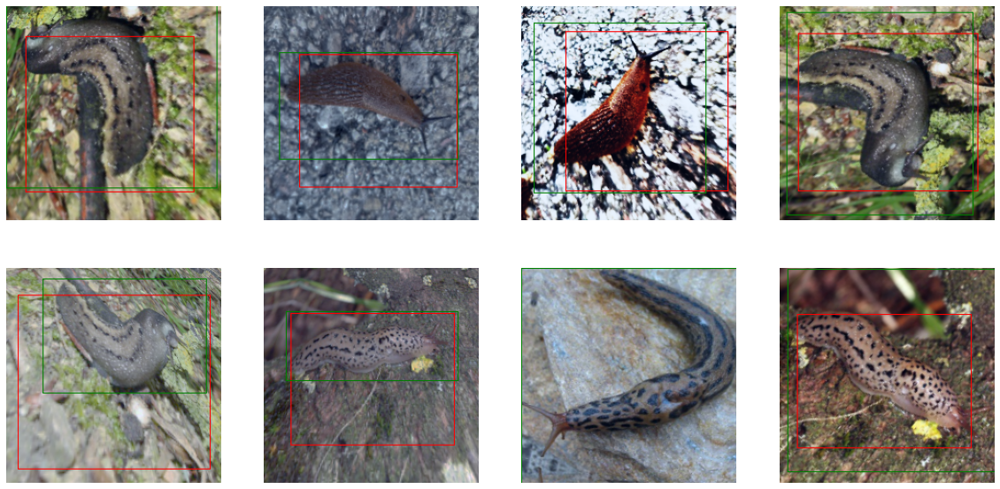

In [ ]:
predicted_bboxes = get_bbox_predictions(bbox_predictor_model, x)
imgs_with_bbox = batch_to_images_with_bboxes(x, predicted_bboxes, bounding_boxes_truth=bboxes_truth)
show_images(imgs_with_bbox, nrows=2, imsize=5)
print(f'Ground truth green, predictions red')

##### Inference on Test set

In [ ]:
item_tfms_test = [Resize(224)]
batch_tfms_test = [Normalize.from_stats(*imagenet_stats)]
dls_test = ImageDataLoaders.from_name_func(path, test_paths, label_func=(lambda x: 'lusitania' in x),
                                           item_tfms=item_tfms_test, batch_tfms=batch_tfms_test, bs=72,
                                           shuffle_train=False, valid_pct=0)
dls_test[0].shuffle = False
#dls_test.show_batch(max_n=9)

In [ ]:
one_batch_sample = dls_test.one_batch()
x_test, y_test = one_batch_sample[0][51:63], one_batch_sample[1][0]
x_test.shape

torch.Size([12, 3, 224, 224])

In [ ]:
predicted_bboxes = get_bbox_predictions(bbox_predictor_model, x_test)
predicted_bboxes.shape

(12, 4)

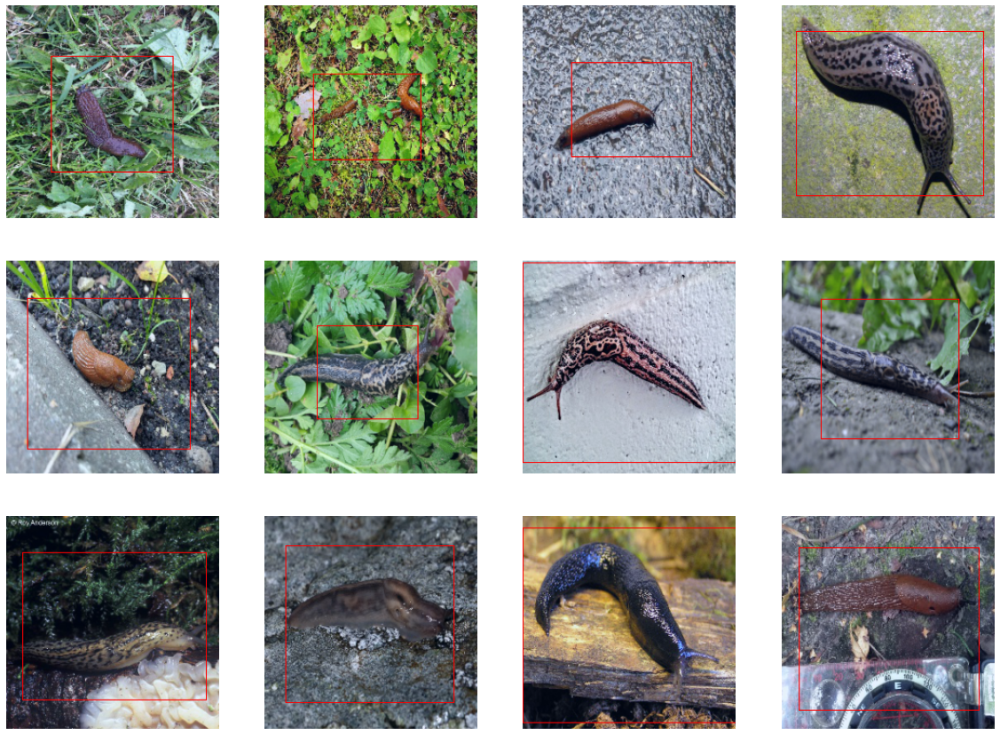

In [ ]:
imgs_with_bbox = batch_to_images_with_bboxes(x_test, predicted_bboxes)
show_images(imgs_with_bbox[:12], nrows=3, imsize=5)

##### Inference on single image

In [ ]:
#inference_image_path = 'inference_images/holeRightSide3.jpg'
inference_image_path = 'inference_images/3.png'

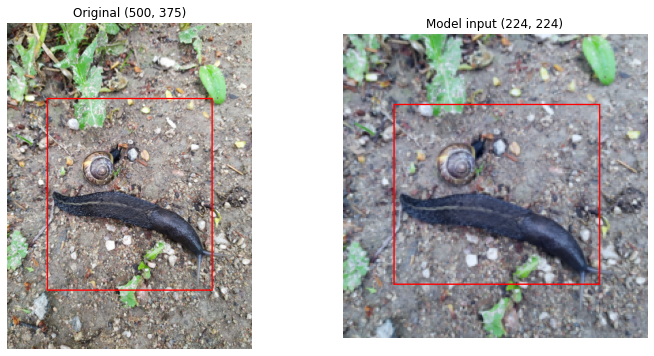

In [ ]:
original_image = PILImage.create(inference_image_path)
dl = dls_test.test_dl([inference_image_path])
x_test = dl.one_batch()

predicted_bboxes = get_bbox_predictions(bbox_predictor_model, x_test[0])
original_width_height = (original_image.shape[1], original_image.shape[0])
original_img_with_bbox = draw_bounding_box(
    original_image,
    rescale_bounding_box(predicted_bboxes.squeeze(0), (224,224), original_width_height),
    color='red',
    width=int(0.0045 * max(original_width_height)))
imgs_with_bbox = batch_to_images_with_bboxes(x_test[0], predicted_bboxes)[0]
show_images([original_img_with_bbox, imgs_with_bbox], imsize=6,
            titles=[f'Original {original_image.shape}', f'Model input {imgs_with_bbox.shape}'])

### Classification with Object Detection: inference

In [85]:
def get_classifier_predictions(predictor_model, batch_to_predict):
  probabilities = F.softmax(predictor_model(batch_to_predict), dim=1).detach().numpy()
  predicted_class_idx = np.argmax(probabilities, axis=1)
  predicted_labels = ['lusitania' if c == 1 else 'limax' for c in predicted_class_idx]
  res = {
      'probabilities': probabilities[:, 1],
      'predicted_class_idx': predicted_class_idx,
      'predicted_labels': predicted_labels
  }
  return res


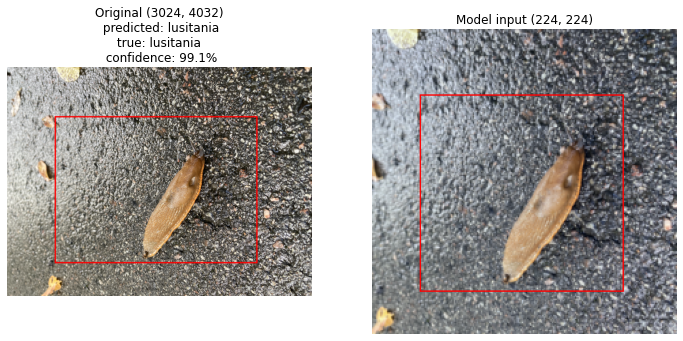

In [98]:
inference_image_path, true_label = Path('inference_images/holeRightSide3.jpg'), 'lusitania'
#inference_image_path, true_label = Path('inference_images/arion_lusitanicus_11.jpg'), 'lusitania'
#inference_image_path, true_label = Path('inference_images/holeRightSide.jpg'), 'lusitania'
#inference_image_path, true_label = Path('inference_images/holeRightSide3.jpg'), 'lusitania'

#inference_image_path, true_label = Path('inference_images/3.png'), 'limax'
#inference_image_path, true_label = Path('inference_images/limax_maximus_6.jpg'), 'limax'
#inference_image_path, true_label = Path('inference_images/limax_cinereoniger_8.jpg'), 'limax'
#inference_image_path, true_label = Path('inference_images/9.png'), 'limax'

original_image = PILImage.create(inference_image_path)

x_test = ((dls_test.test_dl([inference_image_path])).one_batch())[0]
predicted_bboxes = get_bbox_predictions(bbox_predictor_model, x_test)
class_predictions = get_classifier_predictions(classifier_model, x_test)

original_width_height = (original_image.shape[1], original_image.shape[0])
original_img_with_bbox = draw_bounding_box(
    original_image,
    rescale_bounding_box(predicted_bboxes.squeeze(0), (224,224), original_width_height),
    color='red',
    width=int(0.0045 * max(original_width_height)))
imgs_with_bbox = batch_to_images_with_bboxes(x_test, predicted_bboxes)[0]

predicted_label = class_predictions['predicted_labels'][0]
confidence = class_predictions['probabilities'][0] if predicted_label == 'lusitania' else 1 - class_predictions['probabilities'][0]

prediction_text = f'\n predicted: {predicted_label}\n true: {true_label} \n confidence: {round(confidence * 100, 1)}%'

titles = [f'Original {original_image.shape}{prediction_text}',
          f'Model input {imgs_with_bbox.shape}']
show_images([original_img_with_bbox, imgs_with_bbox], imsize=6,
            titles=titles)


### End